In [1]:
pip install squarify

Note: you may need to restart the kernel to use updated packages.


In [78]:
pip install plotly

     |████████████████████████████████| 13.2 MB 285 kB/s eta 0:00:01
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11430 sha256=9a174b894291dc76db0d0180852196aab5107209f09f4a9b0d9f720ab12422a1
  Stored in directory: /Users/dk/Library/Caches/pip/wheels/c4/a7/48/0a434133f6d56e878ca511c0e6c38326907c0792f67b476e56
Successfully built retrying
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import squarify
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from datetime import date,timedelta
import plotly.express as px
from yellowbrick.cluster import KElbowVisualizer,SilhouetteVisualizer,InterclusterDistance
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
plt.style.use('ggplot')
import warnings
warnings.filterwarnings('ignore')

In [2]:
orders = pd.read_csv('~/Desktop/data mining/project/olist_orders_dataset.csv')
payments = pd.read_csv('~/Desktop/data mining/project/olist_order_payments_dataset.csv')

In [3]:
orders['order_delivered_carrier_date'] = pd.to_datetime(orders['order_delivered_carrier_date']) # datetime conversion
payments = payments.set_index('order_id') # preparation before the join
orders = orders.set_index('order_id') # preparation before the join

joined = orders.join(payments) # join on order_id

In [4]:
joined.isna()\
      .sum()\
      .sort_values(ascending=False)

order_delivered_customer_date    3132
order_delivered_carrier_date     1888
order_approved_at                 175
payment_value                       1
payment_installments                1
payment_type                        1
payment_sequential                  1
order_estimated_delivery_date       0
order_purchase_timestamp            0
order_status                        0
customer_id                         0
dtype: int64

In [5]:
joined.nunique()\
      .sort_values(ascending=False)

customer_id                      99441
order_purchase_timestamp         98875
order_delivered_customer_date    95664
order_approved_at                90733
order_delivered_carrier_date     81018
payment_value                    29077
order_estimated_delivery_date      459
payment_sequential                  29
payment_installments                24
order_status                         8
payment_type                         5
dtype: int64

In [6]:
last_date = joined['order_delivered_carrier_date'].max() + pd.to_timedelta(1, 'D')

RFM = joined.dropna(subset=['order_delivered_carrier_date'])\
            .reset_index()\
            .groupby('customer_id')\
            .agg(Recency = ('order_delivered_carrier_date', lambda x: (last_date - x.max()).days ),
                 Frequency = ('order_id', 'size'),
                 Monetary = ('payment_value', 'sum'))

In [7]:
RFM

,Recency,Frequency,Monetary
customer_id,,,
00012a2ce6f8dcda20d059ce98491703,299,1,114.74
000161a058600d5901f007fab4c27140,420,1,67.41
0001fd6190edaaf884bcaf3d49edf079,560,1,195.42
0002414f95344307404f0ace7a26f1d5,389,1,179.35
000379cdec625522490c315e70c7a9fb,161,1,107.01
...,...,...,...
fffcb937e9dd47a13f05ecb8290f4d3e,179,1,91.91
fffecc9f79fd8c764f843e9951b11341,165,3,81.36
fffeda5b6d849fbd39689bb92087f431,110,1,63.13


In [8]:
RFM.isnull().sum()

Recency      0
Frequency    0
Monetary     0
dtype: int64

### Recency

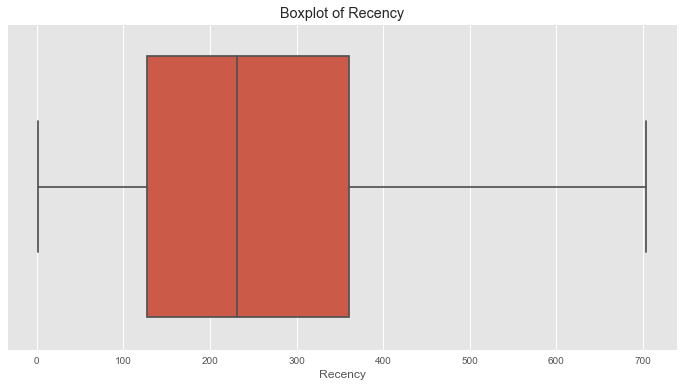

In [9]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Recency', data=RFM)
plt.title('Boxplot of Recency');

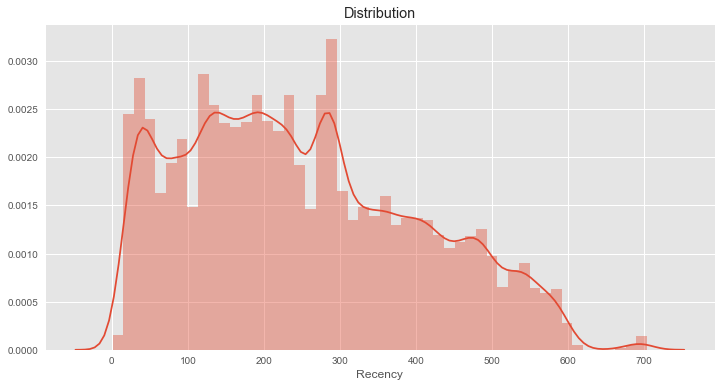

In [10]:
plt.figure(figsize=(12, 6))
plt.title('Distribution')
sns.distplot(RFM['Recency']);

### Frequency

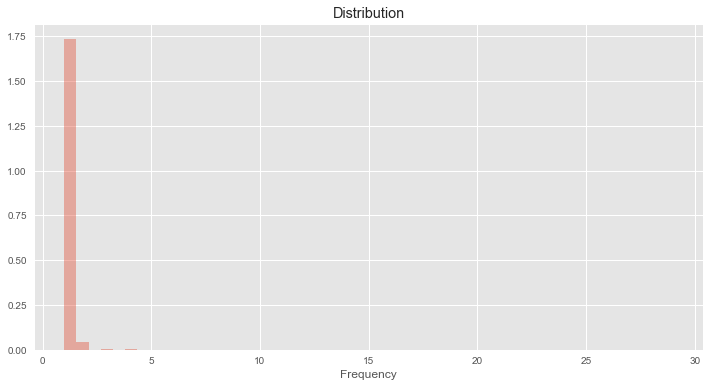

In [11]:
plt.figure(figsize=(12, 6))
plt.title('Distribution')
sns.distplot(RFM['Frequency']);

In [12]:
RFM['Frequency'].value_counts(normalize=True)*100

1     97.025333
2      2.395093
3      0.303099
4      0.108542
5      0.053247
6      0.035839
7      0.028671
8      0.010240
12     0.008192
11     0.008192
9      0.007168
10     0.003072
13     0.003072
14     0.002048
15     0.002048
19     0.002048
26     0.001024
21     0.001024
22     0.001024
29     0.001024
Name: Frequency, dtype: float64

In [13]:
RFM['Frequency'].apply(lambda x: 'less or equal to 5' if x<=5 else 'greater than 5')\
                .value_counts(normalize=True) * 100

less or equal to 5    99.885314
greater than 5         0.114686
Name: Frequency, dtype: float64

In [14]:
RFM = RFM[RFM['Frequency'] <= 5]

### Monetary

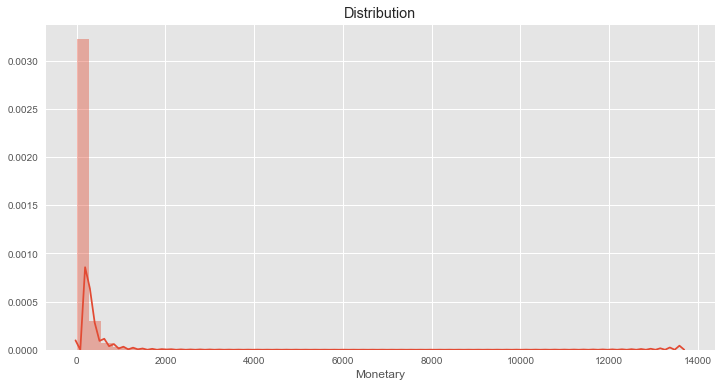

In [15]:
plt.figure(figsize=(12, 6))
plt.title('Distribution')
sns.distplot(RFM['Monetary'])

In [16]:
RFM['Monetary'].describe([0.25, 0.5, 0.75, 0.9, 0.95, 0.99])

count    97546.000000
mean       159.780566
std        218.510326
min          0.000000
25%         61.880000
50%        105.280000
75%        176.255000
90%        305.680000
95%        446.215000
99%       1048.570000
max      13664.080000
Name: Monetary, dtype: float64

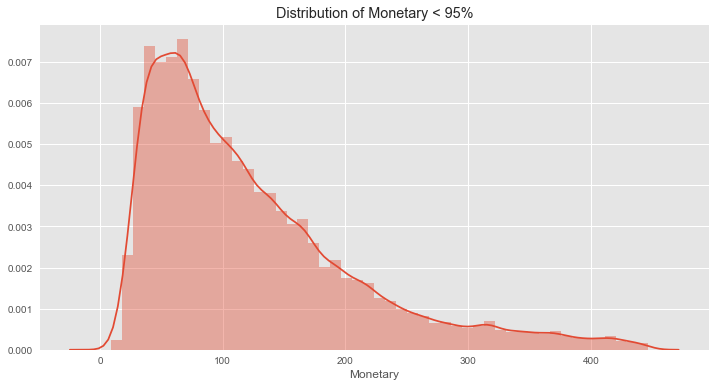

In [17]:
plt.figure(figsize=(12, 6))
plt.title('Distribution of Monetary < 95%')
sns.distplot(RFM[RFM['Monetary']<447].Monetary);

In [18]:
RFM = RFM[RFM['Monetary'] < 447]

In [19]:
RFM.info()

<class 'pandas.core.frame.DataFrame'>
Index: 92678 entries, 00012a2ce6f8dcda20d059ce98491703 to ffffa3172527f765de70084a7e53aae8
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Recency    92678 non-null  int64  
 1   Frequency  92678 non-null  int64  
 2   Monetary   92678 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 2.8+ MB


The outliers orders can represent a significant group of clients, so we keep this for the analysis

In [20]:
std = StandardScaler()
RFM_std = std.fit_transform(RFM)

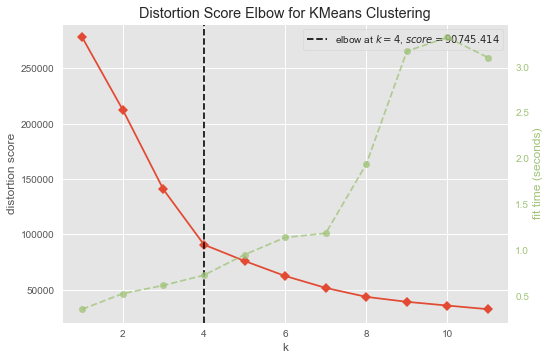

In [21]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12))
visualizer.fit(RFM_std)       
visualizer.show()  

In [22]:
model_k = KMeans(n_clusters=4)
kmeans = model_k.fit(RFM_std)
RFM['Cluster'] = kmeans.labels_

In [23]:
RFM.columns = ['Recency','Frequency','Monetary','Cluster']

In [24]:
RFM.head()

,Recency,Frequency,Monetary,Cluster
customer_id,,,,
00012a2ce6f8dcda20d059ce98491703,299,1,114.74,1
000161a058600d5901f007fab4c27140,420,1,67.41,1
0001fd6190edaaf884bcaf3d49edf079,560,1,195.42,1
0002414f95344307404f0ace7a26f1d5,389,1,179.35,1
000379cdec625522490c315e70c7a9fb,161,1,107.01,0


In [25]:
px.scatter_3d(RFM,x='Recency',y='Frequency',z='Monetary',color='Cluster')

In [27]:
RFM.groupby('Cluster').agg(Recency = ('Recency', 'mean'),
                                          Frequency = ('Frequency', 'mean'),
                                          Monetary = ('Monetary', 'mean'),
                                          GroupSize = ('Recency', 'size'))


,Recency,Frequency,Monetary,GroupSize
Cluster,,,,
0,141.102181,1.000000,91.501069,43423
1,408.167890,1.000000,93.324568,31062
2,237.835371,1.000000,272.686280,15544
3,272.531521,2.245376,119.373567,2649


Slipping - Once Loyal, Now Gone: past customers who haven't bought in awhile.

Rookies - Our Newest Customers. First time buyers on our site.

Promising - Faithful customers.Customers who return often, but do not spend a lot.

Whales - Our Highest Paying Customers.Customers who have generated the most revenue for our store.

### RFM groups

In [28]:
RFM['R_score'] = pd.qcut(RFM['Recency'], 3, labels=range(3, 0, -1)).astype(str)
RFM['F_score'] = RFM['Frequency'].apply(lambda x: '1' if x==1 else '2')
RFM['M_score'] = pd.qcut(RFM['Monetary'], 3, labels=[1, 2, 3]).astype(str)
RFM['RFM_score'] = RFM['R_score'] + RFM['F_score'] + RFM['M_score']

In [29]:
RFM.info()

<class 'pandas.core.frame.DataFrame'>
Index: 92678 entries, 00012a2ce6f8dcda20d059ce98491703 to ffffa3172527f765de70084a7e53aae8
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Recency    92678 non-null  int64  
 1   Frequency  92678 non-null  int64  
 2   Monetary   92678 non-null  float64
 3   Cluster    92678 non-null  int32  
 4   R_score    92678 non-null  object 
 5   F_score    92678 non-null  object 
 6   M_score    92678 non-null  object 
 7   RFM_score  92678 non-null  object 
dtypes: float64(1), int32(1), int64(2), object(4)
memory usage: 8.5+ MB


In [30]:
RFM['R_score'] =RFM['R_score'].astype(int) 
RFM['F_score'] = RFM['F_score'].astype(int) 
RFM['M_score'] =RFM['M_score'].astype(int) 

In [31]:
RFM.head()

,Recency,Frequency,Monetary,Cluster,R_score,F_score,M_score,RFM_score
customer_id,,,,,,,,
00012a2ce6f8dcda20d059ce98491703,299,1,114.74,1,2,1,2,212
000161a058600d5901f007fab4c27140,420,1,67.41,1,1,1,1,111
0001fd6190edaaf884bcaf3d49edf079,560,1,195.42,1,1,1,3,113
0002414f95344307404f0ace7a26f1d5,389,1,179.35,1,1,1,3,113
000379cdec625522490c315e70c7a9fb,161,1,107.01,0,3,1,2,312


In [32]:
score=RFM.iloc[:,4:7]

In [33]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler() 
scaler.fit(score)
RFM_norm = scaler.transform(score)
RFM_norm

array([[-2.31504635e-03, -1.71533823e-01,  7.79324882e-04],
       [-1.22833714e+00, -1.71533823e-01, -1.22339477e+00],
       [-1.22833714e+00, -1.71533823e-01,  1.22495342e+00],
       ...,
       [ 1.22370704e+00, -1.71533823e-01, -1.22339477e+00],
       [ 1.22370704e+00, -1.71533823e-01,  1.22495342e+00],
       [-1.22833714e+00, -1.71533823e-01, -1.22339477e+00]])

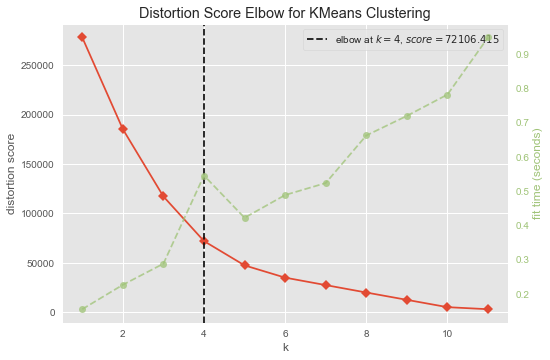

In [34]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12))

visualizer.fit(RFM_norm)  
visualizer.show()  

In [35]:
model_k = KMeans(n_clusters=4)
kmeans = model_k.fit(RFM_norm)
RFM['Cluster_score'] = kmeans.labels_

In [36]:
px.scatter_3d(RFM,x='R_score',y='F_score',z='M_score',color='Cluster_score')

In [37]:
RFM.groupby('Cluster_score').agg(R_score = ('R_score', 'mean'),
                                          F_score = ('F_score', 'mean'),
                                          M_score = ('M_score', 'mean'),
                                          GroupSize = ('R_score', 'size'))



,R_score,F_score,M_score,GroupSize
Cluster_score,,,,
0,3.000000,1,1.501239,19767
1,1.499515,1,1.498768,40181
2,1.884485,2,1.946772,2649
3,2.027393,1,3.000000,30081


Whales - Our Highest Paying Customers.Customers who have generated the most revenue for our store.

Rookies - Our Newest Customers. First time buyers on our site.

Promising - Faithful customers.Customers who return often, but do not spend a lot.

Slipping - Once Loyal, Now Gone: past customers who haven't bought in awhile.

In [38]:
def segment(x):
    if x == '323':
        return 'Core'
    elif x in ['111', '112', '113']:
        return 'Slipping'
    elif x in ['311', '312', '313']:
        return 'Rookies'
    elif x in ['123', '213', '223']:
        return 'Whales'
    elif x in ['221', '222', '121', '122']:
        return 'Loyal'
    else:
        return 'Regular'

In [39]:
RFM['segments'] = RFM['RFM_score'].apply(segment)
RFM['segments'].value_counts(normalize=True)*100

Rookies     32.547099
Slipping    32.028097
Regular     22.199443
Whales      11.516217
Loyal        1.440471
Core         0.268672
Name: segments, dtype: float64

In [40]:
segmentwise = RFM.groupby('segments').agg(RecencyMean = ('Recency', 'mean'),
                                          FrequencyMean = ('Frequency', 'mean'),
                                          MonetaryMean = ('Monetary', 'mean'),
                                          GroupSize = ('Recency', 'size'))
segmentwise

,RecencyMean,FrequencyMean,MonetaryMean,GroupSize
segments,,,,
Core,86.939759,2.220884,221.581847,249
Loyal,345.632210,2.262921,73.224195,1335
Regular,229.625061,1.031302,74.299787,20574
Rookies,88.471058,1.000000,124.585984,30164
Slipping,431.335613,1.000000,122.264921,29683
Whales,238.460695,1.062307,220.948326,10673


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


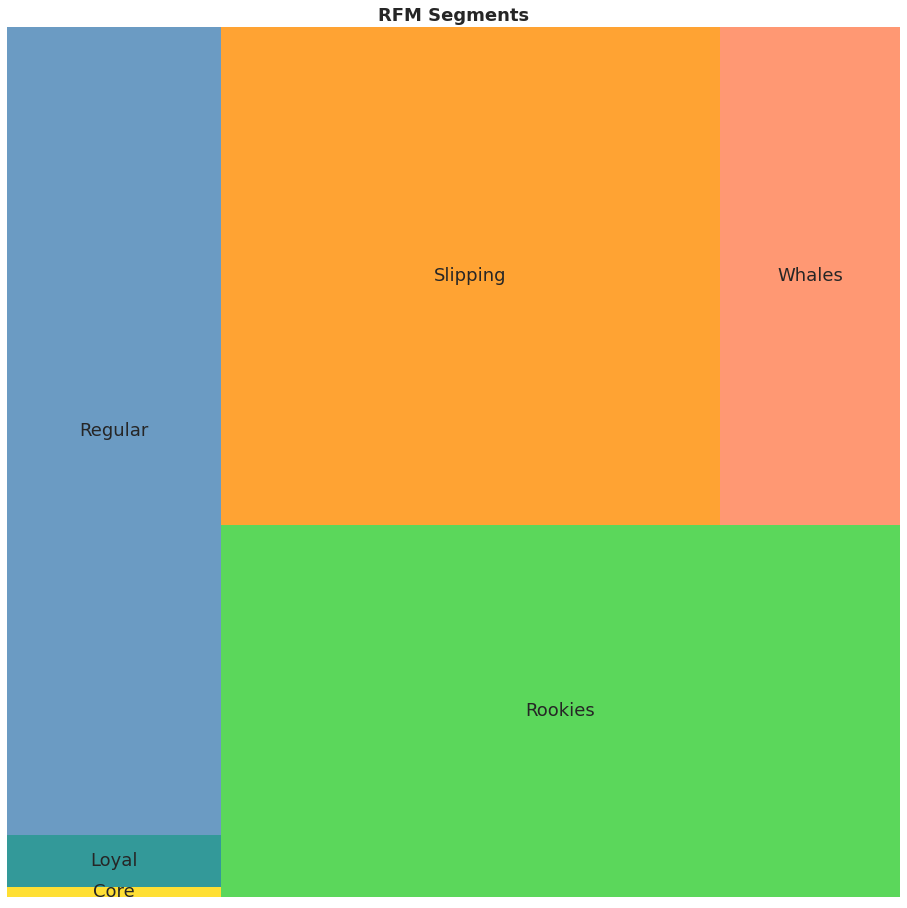

In [41]:
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}

plt.rc('font', **font)


fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(16, 16)
squarify.plot(sizes = segmentwise['GroupSize'], 
              label = segmentwise.index,
              color = ['gold', 'teal', 'steelblue', 'limegreen', 'darkorange', 'coral'],
              alpha = 0.8)
plt.title("RFM Segments",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

Cluster 1: Core - Best Customers (RFM_Score: 323)

Cluster 2: Loyal - Most Loyal Customers (RFM_Score: 221/222/121/122)

Cluster 3: Rookies- Newest Customers(RFM_Score: 31X)

Cluster 4: Whales - Highest Paying Customers (RFM_Score: 1X3/2X3)

Cluster 5: Slipping - Once Loyal, Now Gone. (RFM_Score: 11X)

Cluster 6: Regular- Average in R, F and M. (the other conditions)